# Stage 3: DFU Severity Model Inference & Testing

This notebook allows you to:
1. **Load the trained DFU Severity Model** (EfficientNet-B0).
2. **Evaluate** the model on the validation dataset.
3. **Run Inference** on custom images or folders.

**Classes:** `['grade_1', 'grade_2', 'grade_3', 'grade_4']`

In [1]:
import torch
import timm
import torch.nn as nn
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
import os

# Config
PROJECT_ROOT = Path("..").resolve()
MODEL_PATH = PROJECT_ROOT / "models" / "stage3_severity" / "best_model.pth"
VAL_CSV = PROJECT_ROOT / "data" / "loaders" / "dfu_severity_val.csv"
CLASSES = ['grade_1', 'grade_2', 'grade_3', 'grade_4']
IMG_SIZE = 224
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f"Device: {DEVICE}")
print(f"Model Path: {MODEL_PATH}")

f:\Housepital-AI\Housepital-AI\venv_gpu\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cuda
Model Path: F:\Housepital-AI\Housepital-AI\AI_Pipeline_V2\models\stage3_severity\best_model.pth


## 1. Load Model

In [2]:
def load_model(model_path, num_classes):
    model = timm.create_model('tf_efficientnet_b0', pretrained=False, num_classes=num_classes)
    try:
        state_dict = torch.load(model_path, map_location=DEVICE)
        if 'model_state_dict' in state_dict:
            state_dict = state_dict['model_state_dict']
        model.load_state_dict(state_dict)
        print("✅ Model loaded successfully!")
    except Exception as e:
        print(f"❌ Failed to load model: {e}")
        return None
    
    model.to(DEVICE)
    model.eval()
    return model

model = load_model(MODEL_PATH, len(CLASSES))

# Preprocessing
val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
])

✅ Model loaded successfully!


## 2. Evaluate on Validation Set

In [3]:
# Load Validation Data
if VAL_CSV.exists():
    val_df = pd.read_csv(VAL_CSV)
    # Fix Paths
    def fix_path(p):
        if "data" in str(p):
             clean_path = str(p)[str(p).find("data"):]
             return str(PROJECT_ROOT / clean_path)
        return str(p)

    val_df['abs_path'] = val_df['path'].apply(fix_path)
    
    # Filter existing files
    val_df['exists'] = val_df['abs_path'].apply(lambda x: Path(x).exists())
    print(f"Total Validation Images: {len(val_df)}")
    print(f"Images Found: {val_df['exists'].sum()}")
    
    valid_val_df = val_df[val_df['exists']].reset_index(drop=True)
else:
    print("⚠️ Validation CSV not found.")
    valid_val_df = pd.DataFrame()

Total Validation Images: 1928
Images Found: 1928


Running Evaluation...


100%|██████████| 1928/1928 [00:37<00:00, 51.47it/s]



Classification Report:
              precision    recall  f1-score   support

     grade_1       0.99      1.00      0.99       448
     grade_2       0.99      0.98      0.98       469
     grade_3       0.99      1.00      0.99       549
     grade_4       1.00      1.00      1.00       462

    accuracy                           0.99      1928
   macro avg       0.99      0.99      0.99      1928
weighted avg       0.99      0.99      0.99      1928



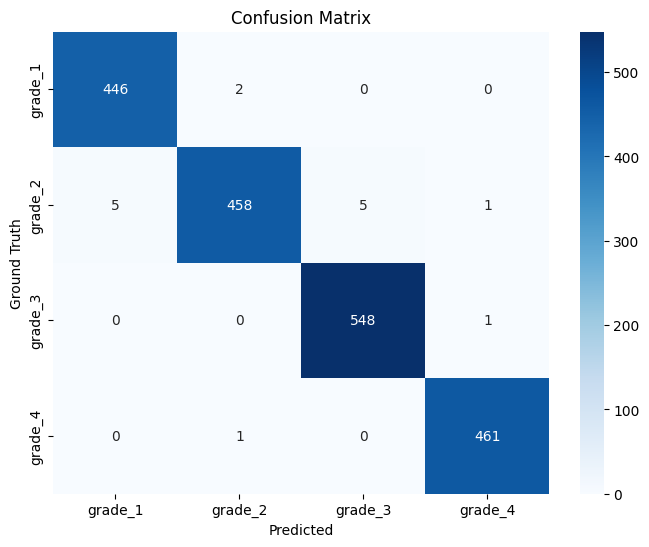

In [4]:
def evaluate(df, model):
    y_true = []
    y_pred = []
    
    print("Running Evaluation...")
    with torch.no_grad():
        for idx, row in tqdm(df.iterrows(), total=len(df)):
            img_path = row['abs_path']
            true_label = row['class']
            
            if true_label not in CLASSES: continue
            
            try:
                image = Image.open(img_path).convert("RGB")
                image = np.array(image)
                aug = val_transform(image=image)
                img_tensor = aug['image'].unsqueeze(0).to(DEVICE)
                
                outputs = model(img_tensor)
                pred_idx = torch.argmax(outputs, dim=1).item()
                pred_label = CLASSES[pred_idx]
                
                y_true.append(true_label)
                y_pred.append(pred_label)
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=CLASSES, labels=CLASSES))
    
    cm = confusion_matrix(y_true, y_pred, labels=CLASSES)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES, yticklabels=CLASSES)
    plt.xlabel('Predicted')
    plt.ylabel('Ground Truth')
    plt.title('Confusion Matrix')
    plt.show()
    return y_true, y_pred

if not valid_val_df.empty:
    evaluate(valid_val_df, model)

## 3. Manual Inference (Try it yourself!)
Use the functions below to test on your own images.

Found 2240 images.
Running inference on all 2240 images...


Predicting: 100%|██████████| 2240/2240 [00:32<00:00, 69.56it/s]
C:\Users\Aly\AppData\Local\Temp\ipykernel_54280\2009943798.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette='viridis')


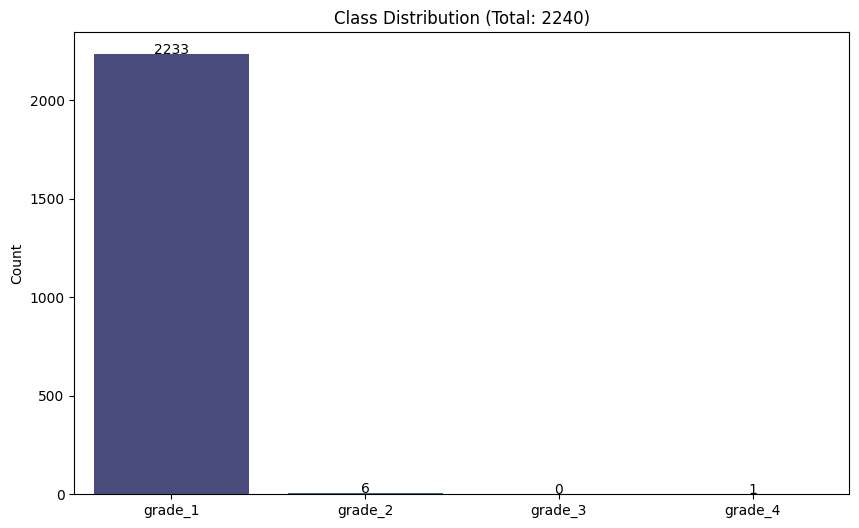

Displaying 16 sample images...


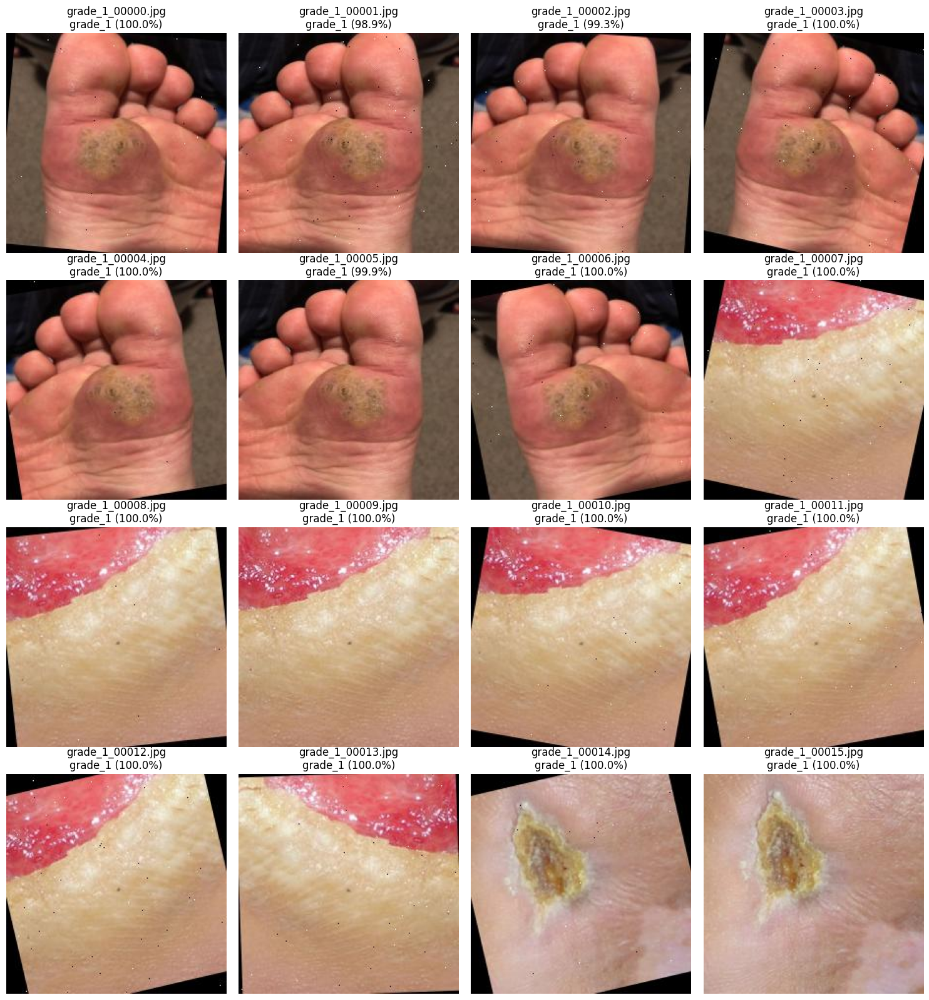

Found 2345 images.
Running inference on all 2345 images...


Predicting: 100%|██████████| 2345/2345 [00:49<00:00, 47.13it/s]
C:\Users\Aly\AppData\Local\Temp\ipykernel_54280\2009943798.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette='viridis')


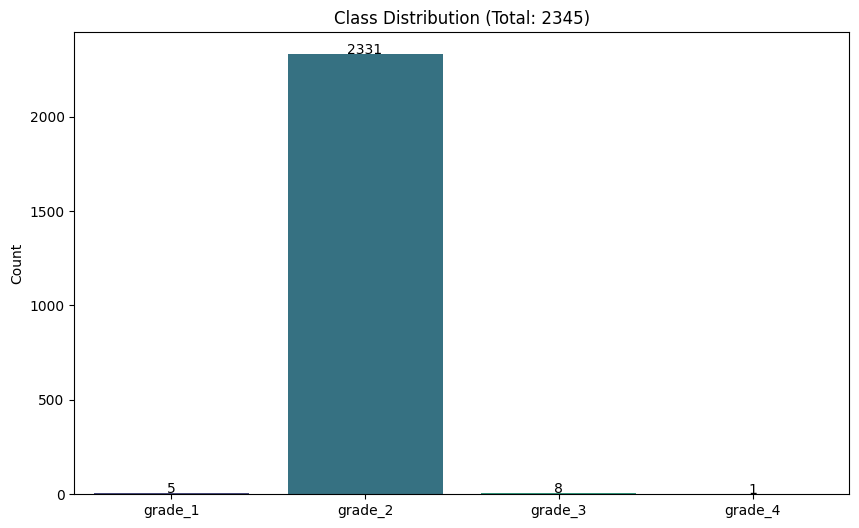

Displaying 16 sample images...


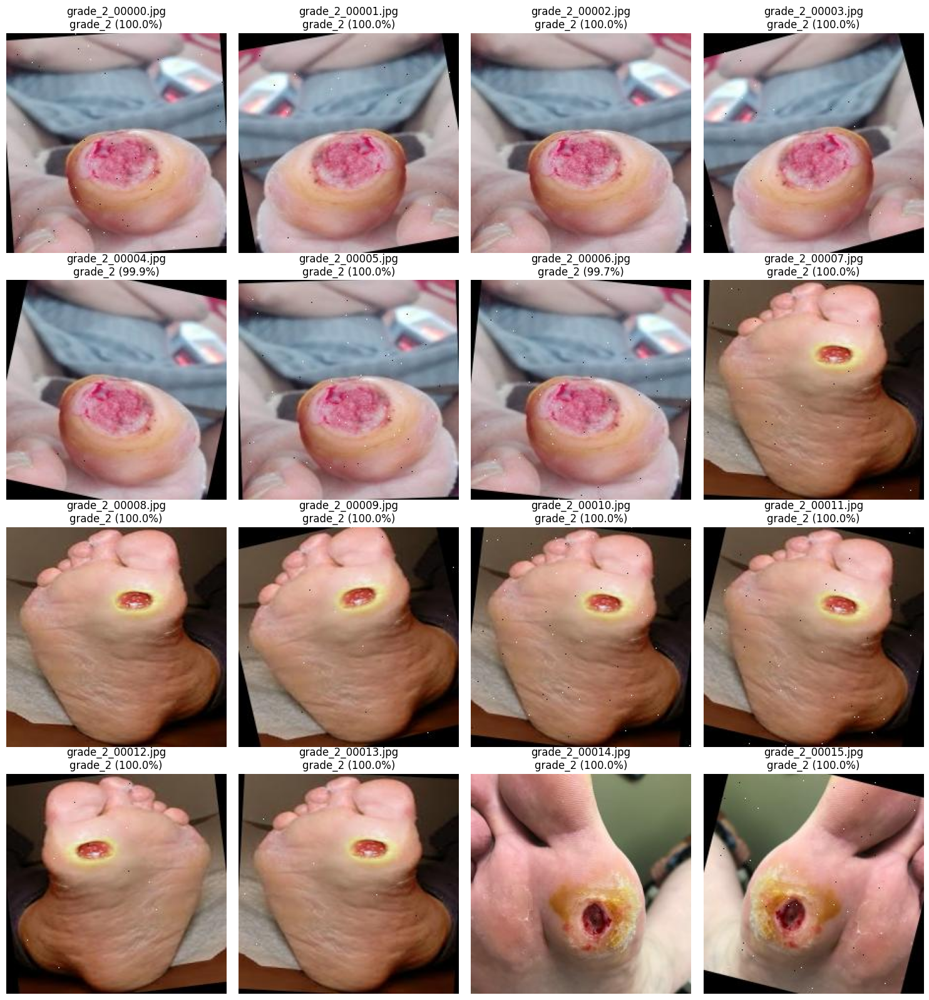

Found 2744 images.
Running inference on all 2744 images...


Predicting: 100%|██████████| 2744/2744 [00:59<00:00, 46.22it/s]
C:\Users\Aly\AppData\Local\Temp\ipykernel_54280\2009943798.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette='viridis')


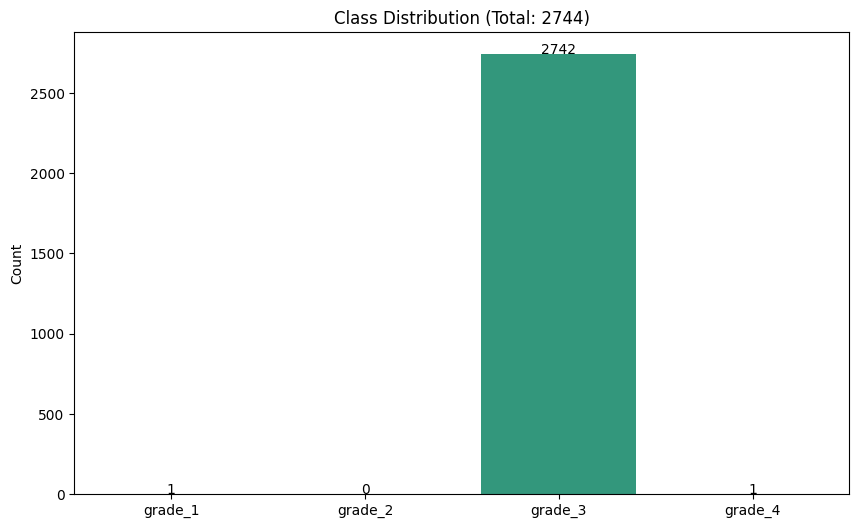

Displaying 16 sample images...


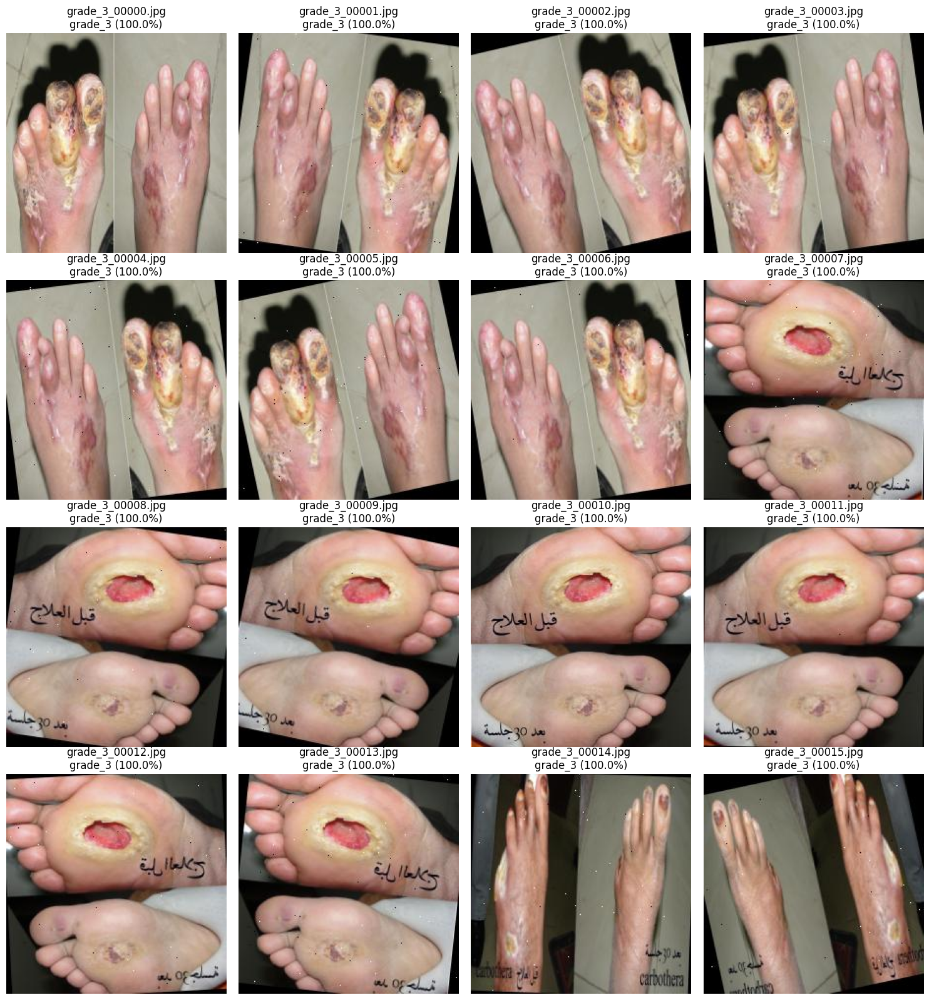

Found 2310 images.
Running inference on all 2310 images...


Predicting: 100%|██████████| 2310/2310 [00:50<00:00, 45.70it/s]
C:\Users\Aly\AppData\Local\Temp\ipykernel_54280\2009943798.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette='viridis')


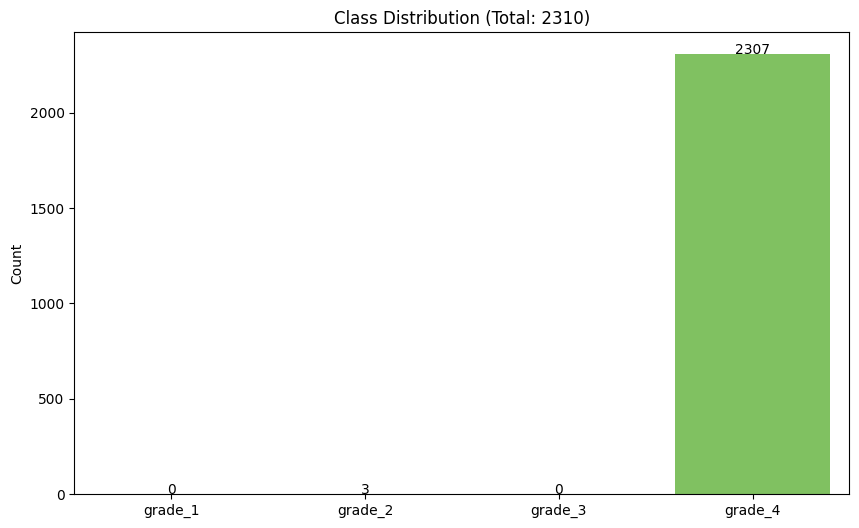

Displaying 16 sample images...


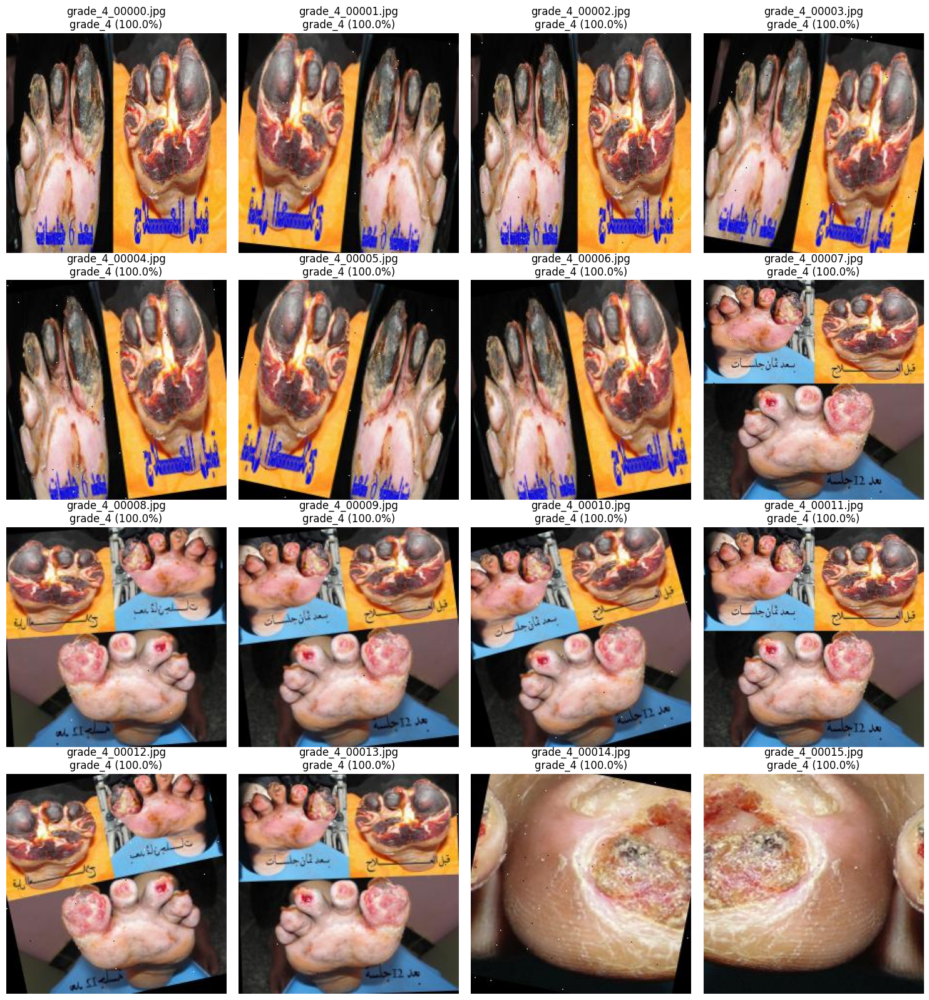

Found 9812 images.
Running inference on all 9812 images...


Predicting: 100%|██████████| 9812/9812 [03:56<00:00, 41.54it/s]
C:\Users\Aly\AppData\Local\Temp\ipykernel_54280\2009943798.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette='viridis')


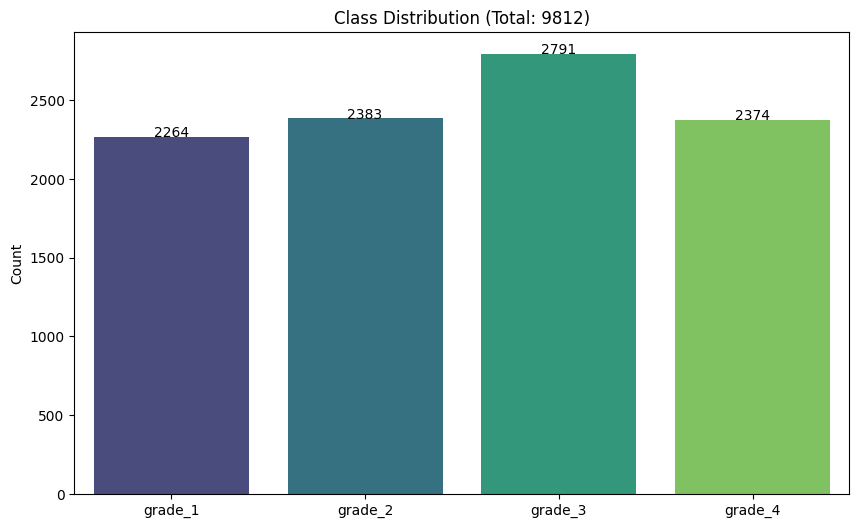

Displaying 16 sample images...


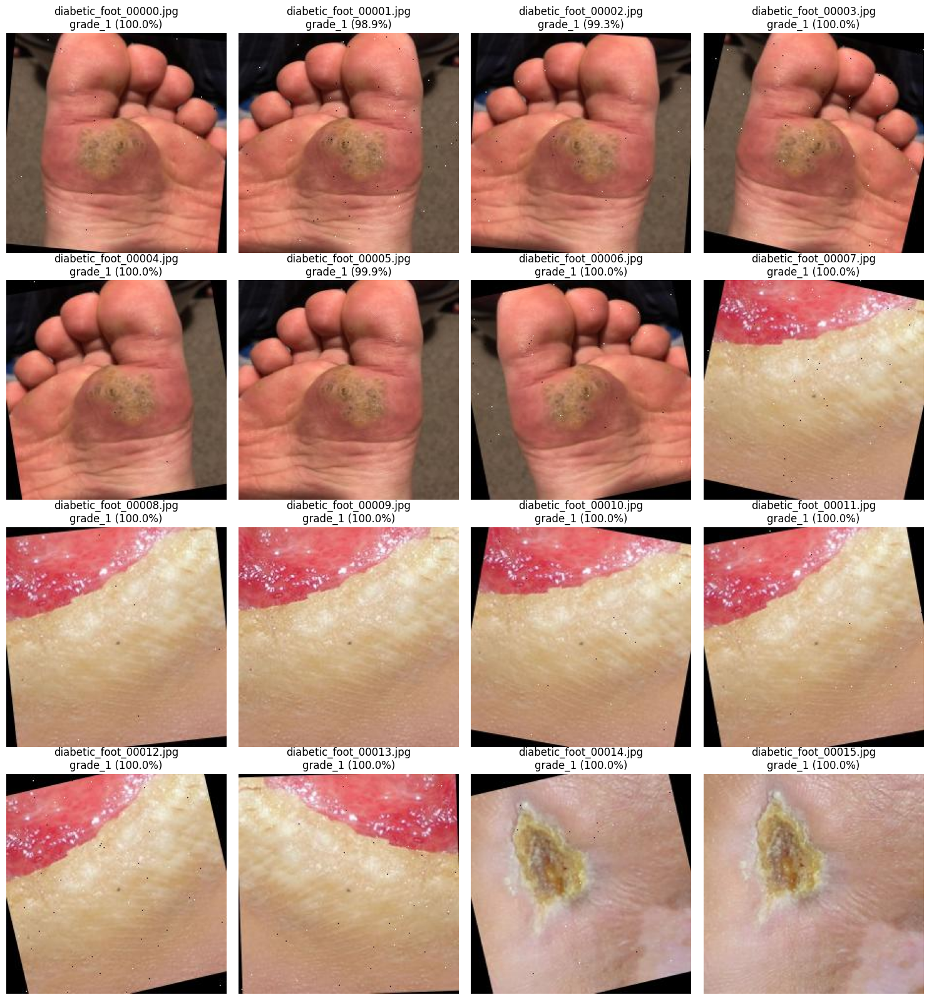

In [5]:
def predict_folder(folder_path, extensions=['*.jpg', '*.jpeg', '*.png'], limit=16):
    folder = Path(folder_path)
    if not folder.exists():
        print(f"❌ Folder not found: {folder_path}")
        return

    files = []
    for ext in extensions:
        files.extend(list(folder.glob(ext)))
    
    total_cnt = len(files)
    print(f"Found {total_cnt} images.")
    
    if total_cnt == 0:
        return

    # 1. Run Prediction on ALL files (to get stats)
    stats = {cls: 0 for cls in CLASSES}
    grid_images = [] 
    
    print(f"Running inference on all {total_cnt} images...")
    
    for idx, fpath in enumerate(tqdm(files, desc="Predicting")):
        try:
            image = Image.open(fpath).convert("RGB")
            img_arr = np.array(image)
            aug = val_transform(image=img_arr)
            img_tensor = aug['image'].unsqueeze(0).to(DEVICE)
            
            with torch.no_grad():
                out = model(img_tensor)
                prob = torch.softmax(out, dim=1)[0]
                pred_idx = torch.argmax(prob).item()
                conf = prob[pred_idx].item()
                pred_lbl = CLASSES[pred_idx]
            
            stats[pred_lbl] += 1
            if limit is not None and idx < limit:
                grid_images.append((image, fpath.name, pred_lbl, conf))
            elif limit is None:
                grid_images.append((image, fpath.name, pred_lbl, conf))
                
        except Exception as e:
            print(f"Error reading {fpath}: {e}")

    # 2. Show Bar Chart if > 20 images
    if total_cnt > 20:
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(x=list(stats.keys()), y=list(stats.values()), palette='viridis')
        plt.title(f"Class Distribution (Total: {total_cnt})")
        plt.ylabel("Count")
        
        # Add exact numbers on bars
        for i, p in enumerate(ax.patches):
            height = p.get_height()
            ax.text(p.get_x() + p.get_width() / 2., height + 0.1, f'{int(height)}', ha="center")
            
        plt.show()
    
    # 3. Display Grid (Limited)
    if grid_images:
        print(f"Displaying {len(grid_images)} sample images...")
        cols = 4
        rows = (len(grid_images) + cols - 1) // cols
        plt.figure(figsize=(15, 4 * rows))
        
        for idx, (img, fname, lbl, conf) in enumerate(grid_images):
            plt.subplot(rows, cols, idx+1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{fname}\n{lbl} ({conf:.1%})")
            
        plt.tight_layout()
        plt.show()

def predict_image(image_path):
    path_obj = Path(image_path)
    if not path_obj.exists():
        print(f"❌ File not found: {image_path}")
        return
    
    if path_obj.is_dir():
        print(f"📂 Detected folder: {image_path}. Switching to predict_folder()...")
        predict_folder(image_path)
        return
        
    image = Image.open(image_path).convert("RGB")
    orig_image = image.copy() # Keep for display
    image = np.array(image)
    
    aug = val_transform(image=image)
    img_tensor = aug['image'].unsqueeze(0).to(DEVICE)
    
    with torch.no_grad():
        outputs = model(img_tensor)
        probs = torch.softmax(outputs, dim=1)[0]
        pred_idx = torch.argmax(probs).item()
        pred_label = CLASSES[pred_idx]
        confidence = probs[pred_idx].item()
        
    plt.imshow(orig_image)
    plt.axis('off')
    plt.title(f"Pred: {pred_label} ({confidence:.2%})")
    plt.show()
    
    print(f"\nPrediction: {pred_label}")
    print(f"Confidence: {confidence:.4f}")
    print("Class Probabilities:")
    for i, cls in enumerate(CLASSES):
        print(f"  {cls}: {probs[i].item():.4f}")

predict_folder('../data/raw/severity_dfu/grade_1')
predict_folder('../data/raw/severity_dfu/grade_2')
predict_folder('../data/raw/severity_dfu/grade_3')
predict_folder('../data/raw/severity_dfu/grade_4')
predict_folder('../data/raw/type_classification/diabetic_foot')


### Example Usage:
```python
# Test single image
predict_image("path/to/your/image.jpg")

# Test folder
predict_folder("path/to/your/folder")

# Auto-detection (Folder passed to predict_image)
predict_image("path/to/your/folder")
```